# Problem Set 11 (Molecular Dynamics)

In [1]:
using LinearAlgebra
using Plots
using Colors
using Statistics
using Polynomials
using StatsBase
using ProgressBars
gr()

Plots.GRBackend()

initial conditions

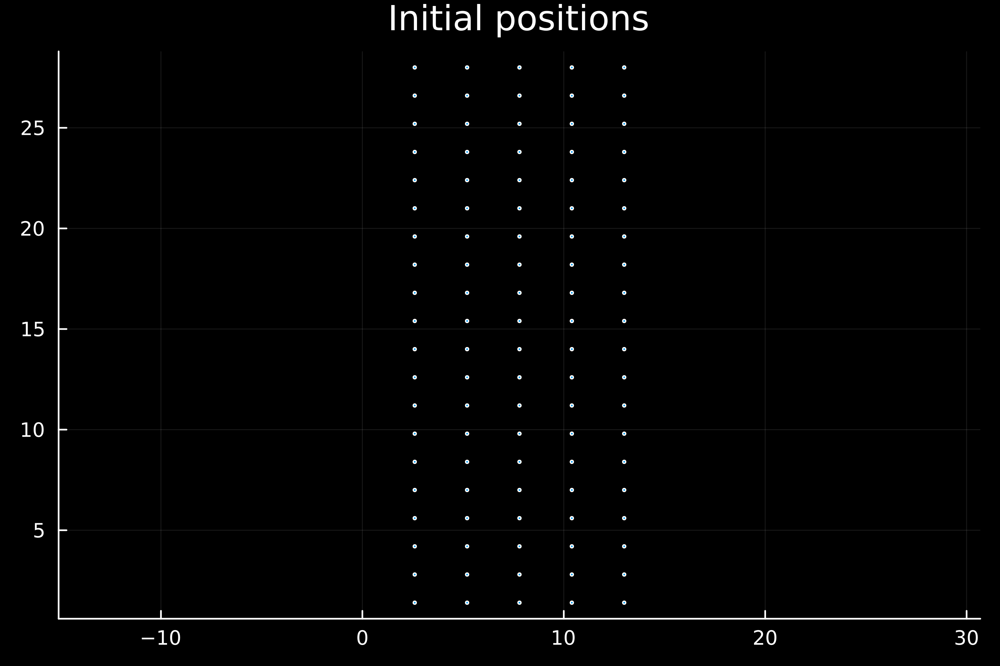

In [3]:
l = 30 #box size
Nx = 5 #number of particle columns
Ny = 20 #number of particle rows
rc = 3 #cutoff point where the potential is less than -0.005
Fc = -0.011 #force at the cutoff point
Vc = -0.005 #potential at the cutoff point
dt = 0.0001 #time steps
dt2 = dt^2 #time squared to reduce computing time
N = Int(Nx * Ny)
function positionInit()
    X = zeros(N) 
    Y = zeros(N)
    Xborder = [0, l, l, 0, 0]
    Yborder = [0, 0, l, l, 0]
    counter = 1
    for i in 1:Nx
        for j in 1:Ny
        X[counter] = i * (l - 4) / 2 / Nx
        Y[counter] = j * (l - 2) / Ny
        counter += 1
        end 
    end
    return X, Y
end
X, Y = positionInit()
scatter(X, Y, title = "Initial positions", dpi = 500, background = :black, legend = false, aspectratio = 1, markersize = 1)

Initial Velocities

In [4]:
function velocityInit(v0Max) #maximum initial velocity of the particles
    Vx = zeros(N)
    Vy = zeros(N)
    #random values for vy and vx
    for i in 1:N
        Vx[i] = v0Max * (rand() - 0.5)
        Vy[i] = v0Max * (rand() - 0.5)
    end
    #shifting the velocities so the average is zero
    avx = mean(Vx)
    avy = mean(Vy)
    for i in 1:N
        Vx[i] = Vx[i] - avx
        Vy[i] = Vy[i] - avy
    end
    return Vx, Vy
end

velocityInit (generic function with 1 method)

function that calculates the array of forces on all particles and the total potential energy (we use periodic boundary conditions from now on)


In [5]:
function force(X, Y)
    Fx = zeros(N)
    Fy = zeros(N)
    PE = 0 #the potential energy
    for i in 1:N-1
        x1 = X[i]
        y1 = Y[i]
        for j in i+1:N
            x2 = X[j]
            y2 = Y[j]
            dx = x2 - x1
            dy = y2 - y1 
            #implementing the periodic conditions
            if abs(dx) > (l / 2)
                dx = (l - abs(dx)) * (-dx) / abs(dx)
            end
            if abs(dy) > (l / 2)
                dy = (l - abs(dy)) * (-dy) / abs(dy)
            end
            r = sqrt(dx^2 + dy^2)

            if r <= rc
                F = - 4 * ((12 / r ^ 13) - (6 / r ^ 7)) + Fc #the force
                V = 4 * (1 / r ^ 12 - 1 / r ^ 6) - Vc + (r - rc) * Fc #the potential
                Fx[i] = Fx[i] + F * dx / r
                Fy[i] = Fy[i] + F * dy / r
                Fx[j] = Fx[j] - F * dx / r
                Fy[j] = Fy[j] - F * dy / r
                PE = PE + V
            end
        end
    end
    return Fx, Fy, PE
end

force (generic function with 1 method)

Function that updates the positions of the particles by one step. (we use the velocity verlet integration method)

In [6]:
function positionUpdate(X, Y, Vx, Vy, Fx, Fy)
    for i in 1:N
        X[i] = X[i] + Vx[i] * dt + 0.5 * Fx[i] *  dt2
        Y[i] = Y[i] + Vy[i] * dt + 0.5 * Fy[i] *  dt2
        #implementing the periodic boundary conditions
        if X[i] >= l
            X[i] = X[i] - l
        elseif X[i] < 0
            X[i] = X[i] + l
        end
        if Y[i] >= l
            Y[i] = Y[i] - l
        elseif Y[i] < 0
            Y[i] = Y[i] + l
        end
    end
    return X, Y
end

positionUpdate (generic function with 1 method)

Function that updates the velocities and calculates the kinetic energy while the velocities are loaded to save time.

In [7]:
function velocityUpdate(Vx, Vy, Fx, Fy, FxOld, FyOld)
    for i in 1:N
        Vx[i] = Vx[i] + (Fx[i] + FxOld[i]) / 2 * dt
        Vy[i] = Vy[i] + (Fy[i] + FyOld[i]) / 2 * dt
    end
    KE = 0 #kinetic energy
    for i in 1:N
        KE = KE + 0.5 * (Vx[i] ^ 2 + Vy[i]^2)
    end
    return Vx, Vy, KE
end

velocityUpdate (generic function with 1 method)

Testing the code using an animation.

┌ Info: Saved animation to C:\Users\moham\AppData\Local\Temp\jl_ugD0hZqcXm.gif
└ @ Plots C:\Users\moham\.julia\packages\Plots\bMtsB\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\moham\\AppData\\Local\\Temp\\jl_ugD0hZqcXm.gif")
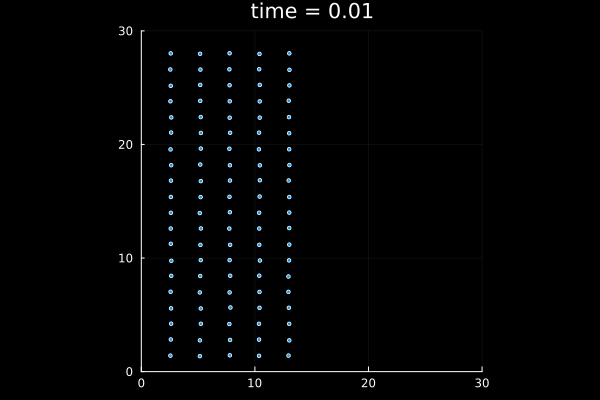

In [31]:
Vx, Vy = velocityInit(10)
Fx, Fy, PE = force(X, Y)
time = 0
anim = @animate for i in 1:1000
    for k in 1:100
        global X, Y = positionUpdate(X, Y, Vx, Vy, Fx, Fy)
        FxOld = deepcopy(Fx)
        FyOld = deepcopy(Fy)
        global Fx, Fy, PE = force(X, Y)
        global Vx, Vy, KE = velocityUpdate(Vx, Vy, Fx, Fy, FxOld, FyOld)
        global time = round(time + dt, digits = 4)
    end
    scatter(X, Y, title = "time = $time", background = :black, legend = false, aspectratio = 1, markersize = 2, xlims = (0, l), ylims = (0, l))
end
gif(anim, fps = 50)

Function that calculates the number of particles on the left side.

In [8]:
function leftSide(X)
    count = 0
    for i in 1:N
        if X[i] < l / 2
            count += 1
        end
    end
    return count / N
end

leftSide (generic function with 1 method)

Function that calculates the pressure. (using the virial formula)

In [9]:
function pressure(X, Y, Fx, Fy, T)
    secondTerm = 0
    for i in 1:N-1
        for j in i+1:N
            secondTerm = secondTerm + (X[j] - X[i]) * (Fx[j] - Fx[i]) + (Y[j] - Y[i]) * (Fy[j] - Fy[i])
        end
    end
    P = 1 / l ^ 2 * (N * T - secondTerm / 3)
end

pressure (generic function with 1 method)

Main loop


In [11]:
X, Y = positionInit()
Vx, Vy = velocityInit(5)
Fx, Fy, PE = force(X, Y)
timearr = []
KEarr = Float64[]
PEarr = Float64[]
Parr = Float64[]
Tarr = Float64[]
leftPercentarr = Float64[]
time = 0
for i in 1:10000
    for k in 1:10
        X, Y = positionUpdate(X, Y, Vx, Vy, Fx, Fy)
        FxOld = deepcopy(Fx)
        FyOld = deepcopy(Fy)
        global Fx, Fy, PE = force(X, Y)
        global Vx, Vy, KE = velocityUpdate(Vx, Vy, Fx, Fy, FxOld, FyOld)
    end
    time = time + 1
    T = 2 * KE
    push!(timearr, time)
    push!(KEarr, KE)
    push!(PEarr, PE)
    push!(Parr, pressure(X, Y, Fx, Fy, T))
    push!(Tarr, T)
    push!(leftPercentarr, leftSide(X))
end

Energy Conservation

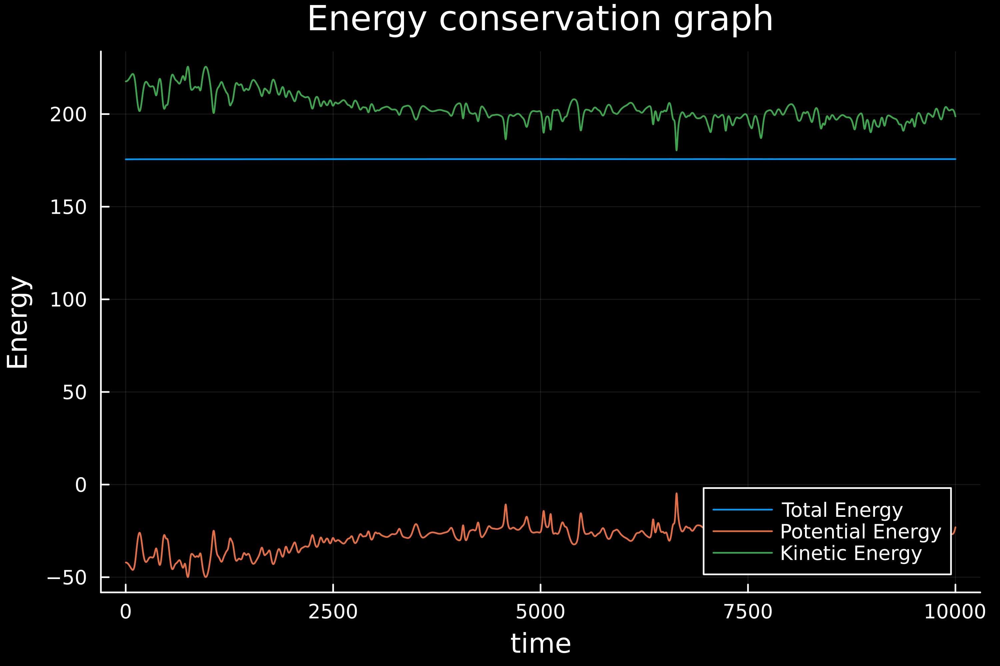

In [12]:
TEarr = PEarr .+ KEarr #total energy
plot(timearr, TEarr, background = :black, dpi = 500, title = "Energy conservation graph", label = "Total Energy", xlabel = "time", ylabel = "Energy")
plot!(timearr, PEarr, label = "Potential Energy")
plot!(timearr, KEarr, label = "Kinetic Energy")

Particles on the left side.

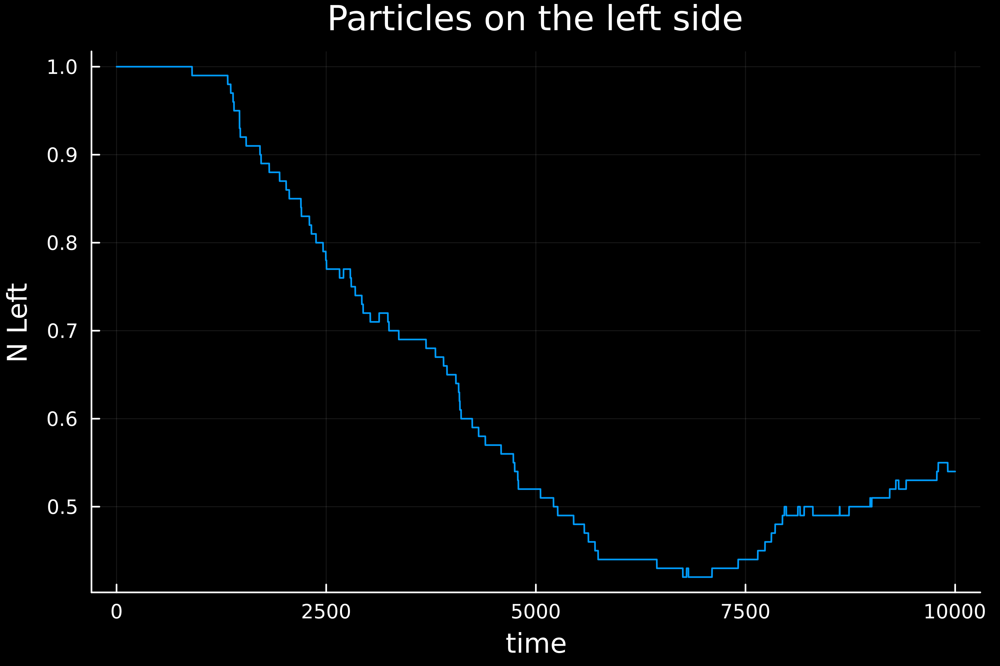

In [13]:
plot(timearr, leftPercentarr, background = :black, dpi = 500, title = "Particles on the left side", legend = false, xlabel = "time", ylabel = "N Left")

Temperature over time.

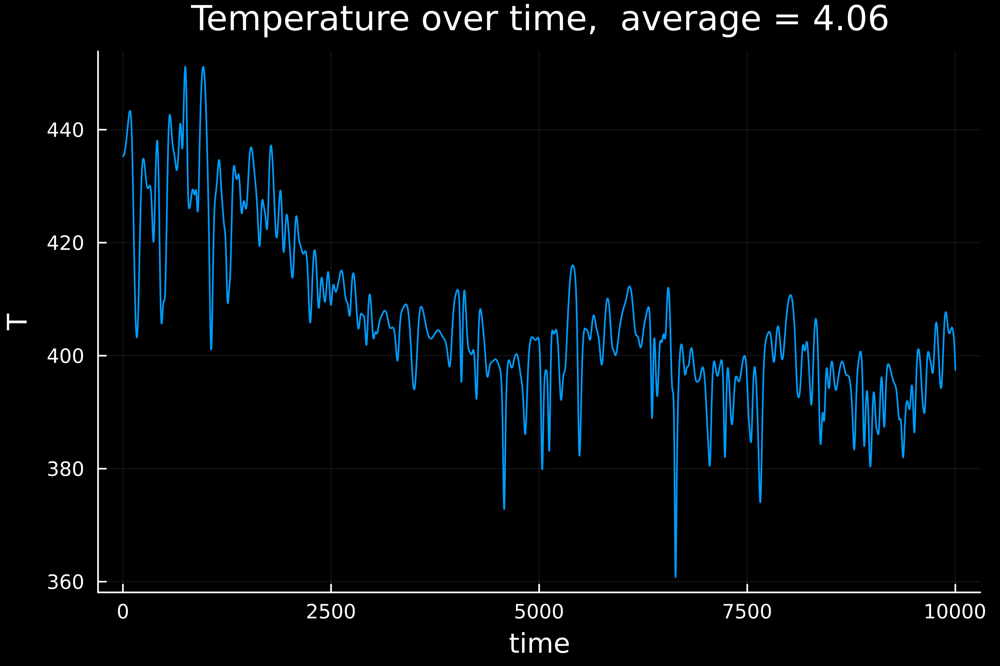

In [14]:
avgTemp = round(mean(Tarr), digits = 0) / N
plot(timearr, Tarr, background = :black, dpi = 500, title = "Temperature over time,  average = $avgTemp", legend = false, xlabel = "time", ylabel = "T")

pressure over time.

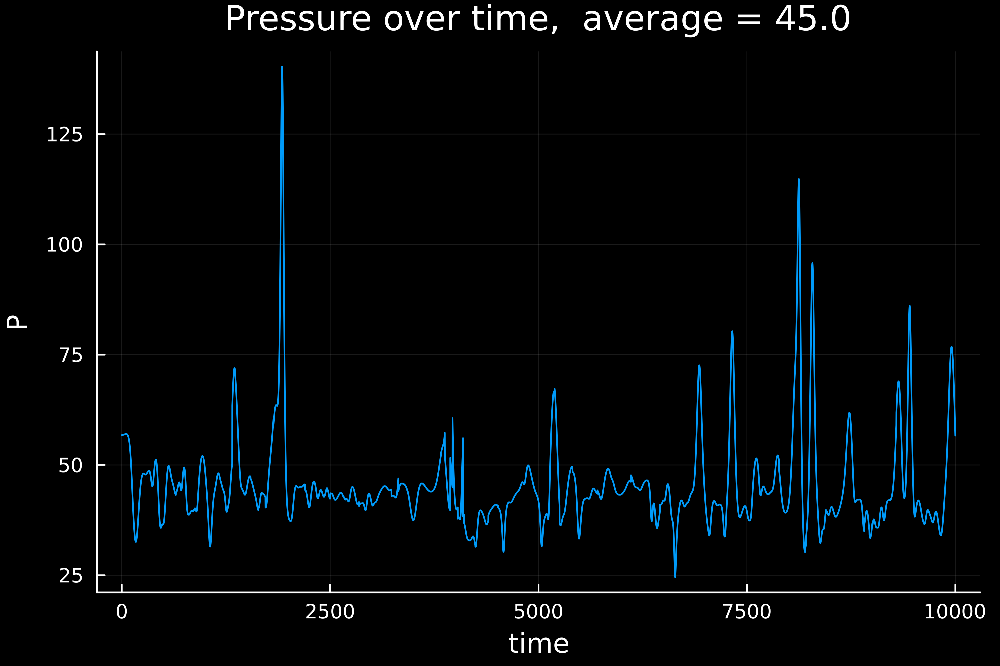

In [15]:
avgP = round(mean(Parr), digits = 0)
plot(timearr, Parr, background = :black, dpi = 500, title = "Pressure over time,  average = $avgP", legend = false, xlabel = "time", ylabel = "P")

pressure against temperature.

In [26]:
Paverages = Float64[]
Taverages = Float64[]
for j in 1:10
    X, Y = positionInit()
    Vx, Vy = velocityInit(j)
    Fx, Fy, PE = force(X, Y)
    timearr = []
    KEarr = Float64[]
    PEarr = Float64[]
    Parr = Float64[]
    Tarr = Float64[]
    leftPercentarr = Float64[]
    time = 0
    for i in 1:1000
        for k in 1:10
            X, Y = positionUpdate(X, Y, Vx, Vy, Fx, Fy)
            FxOld = deepcopy(Fx)
            FyOld = deepcopy(Fy)
            global Fx, Fy, PE = force(X, Y)
            global Vx, Vy, KE = velocityUpdate(Vx, Vy, Fx, Fy, FxOld, FyOld)
        end
        T = 2 * KE
        push!(Parr, pressure(X, Y, Fx, Fy, T))
        push!(Tarr, T)
    end
    push!(Paverages, mean(Parr))
    push!(Taverages, mean(Tarr))
end

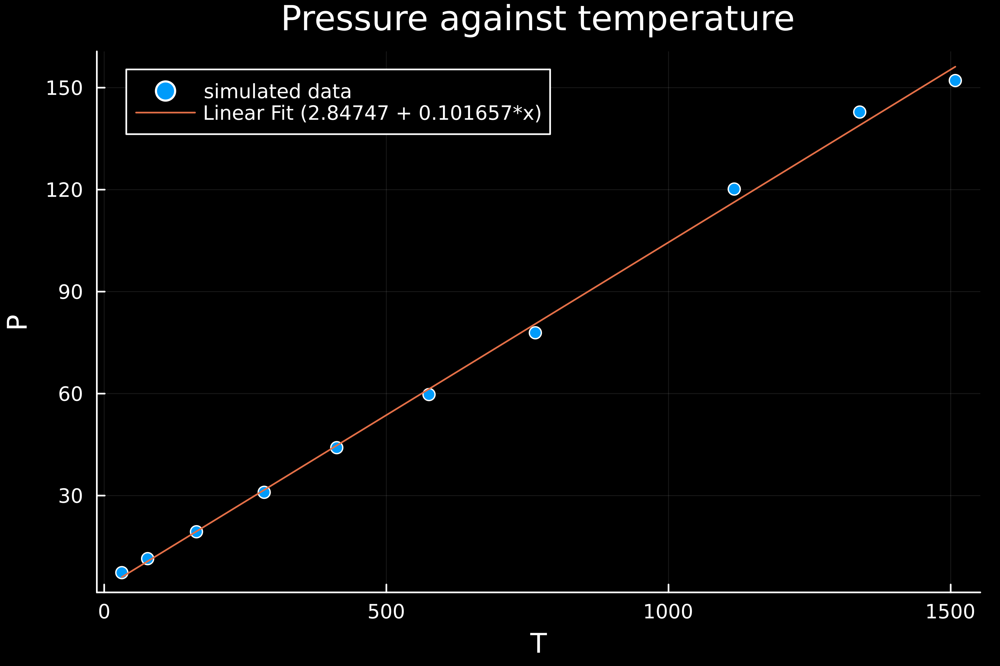

In [27]:
fh = Polynomials.fit(Taverages, Paverages, 1)
scatter(Taverages, Paverages, background = :black, dpi = 500, title = "Pressure against temperature", label = "simulated data", xlabel = "T", ylabel = "P")
plot!(fh, extrema(Taverages)..., label="Linear Fit ($fh)")

Simulation with energy decreasing over time.

┌ Info: Saved animation to C:\Users\moham\AppData\Local\Temp\jl_rmh9W52Qgk.gif
└ @ Plots C:\Users\moham\.julia\packages\Plots\bMtsB\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\moham\\AppData\\Local\\Temp\\jl_rmh9W52Qgk.gif")
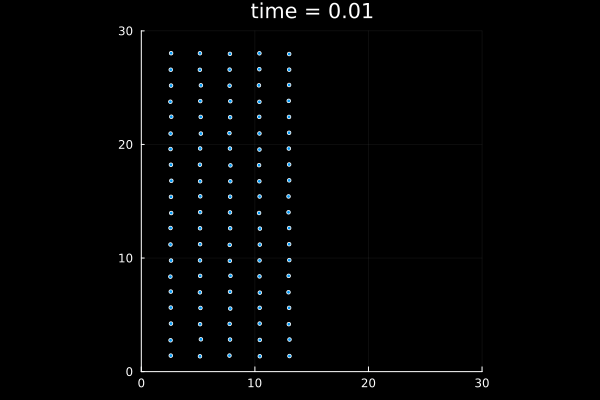

In [45]:
X, Y = positionInit()
Vx, Vy = velocityInit(10)
Fx, Fy, PE = force(X, Y)
time = 0
TEarr = Float64[]
Tarr = Float64[]
anim = @animate for i in 1:1000
    for k in 1:100
        global X, Y = positionUpdate(X, Y, Vx, Vy, Fx, Fy)
        FxOld = deepcopy(Fx)
        FyOld = deepcopy(Fy)
        global Fx, Fy, PE = force(X, Y)
        global Vx, Vy, KE = velocityUpdate(Vx, Vy, Fx, Fy, FxOld, FyOld)
        global time = round(time + dt, digits = 4)
        Vx = Vx .* 0.9999 #scaling of the speed of the molecules
        Vy = Vy .* 0.9999
    end
    push!(Tarr, 2 * KE)
    push!(TEarr, PE + KE)
    scatter(X, Y, title = "time = $time", background = :black, legend = false, aspectratio = 1, markersize = 2, xlims = (0, l), ylims = (0, l))
end
gif(anim, fps = 50)

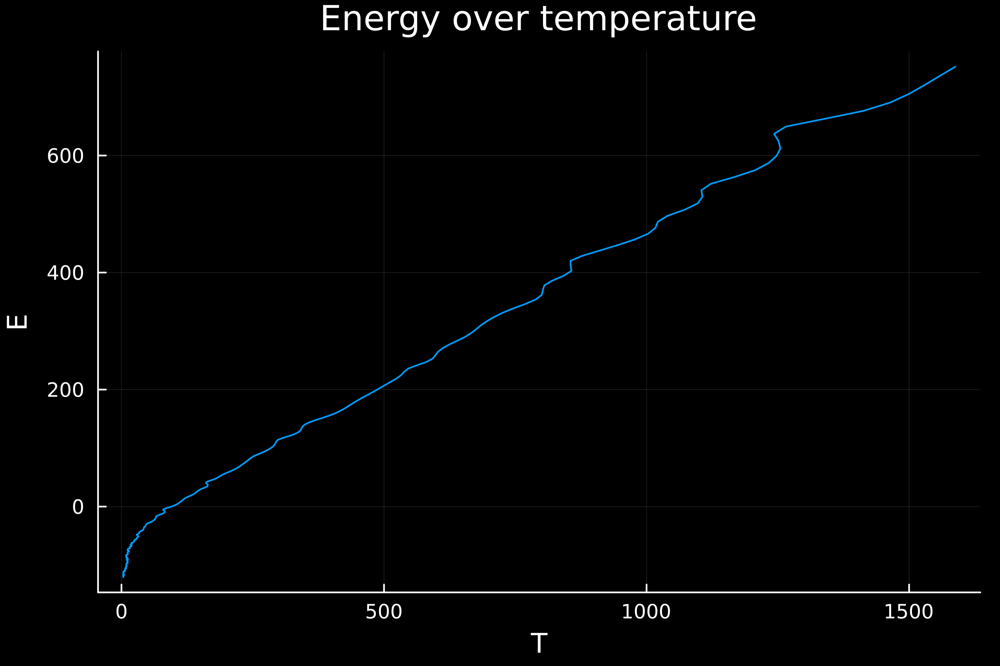

In [48]:
plot(Tarr, TEarr, background = :black, dpi = 500, title = "Energy over temperature", legend = false, xlabel = "T", ylabel = "E")